In [ ]:

#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
03_scene_clip.ipynb

Klasyfikacja typu sceny (ulica, wnętrze, wieś, portret, demonstracja itd.)
z użyciem modelu CLIP (ViT-B/32) w trybie zero-shot.

Wejście:  obrazy JPG / TIFF
Wyjście:  plik CSV z kolumnami [filename, scene_label, score, top3_labels]
"""

# 1️⃣ Importy i konfiguracja
from pathlib import Path
import pandas as pd
from PIL import Image
import torch
import clip

# Wybór urządzenia
device = "cuda" if torch.cuda.is_available() else "cpu"

# Wczytanie modelu CLIP
model, preprocess = clip.load("ViT-B/32", device=device)

# Folder ze zdjęciami testowymi
IMG_DIR = Path("data/test_scenes")

# Lista promptów (etykieta_PL, prompt_EN)
scene_prompts = [
    ("plac miejski", "city square"),
    ("targowisko lub rynek", "street market"),
    ("fabryka lub zakład przemysłowy", "factory exterior"),
    ("demonstracja uliczna", "street protest"),
    ("blokowisko lub osiedle mieszkaniowe", "apartment block area"),
    ("komunikacja miejska", "public transport in the city"),
    ("scena wiejska", "rural countryside scene"),
    ("pola i gospodarstwa", "farmland landscape"),
    ("droga wiejska", "country road"),
    ("wieś z zabudową tradycyjną", "village street"),
    ("wnętrze mieszkania", "interior of a flat"),
    ("wnętrze biura lub instytucji", "office or institutional interior"),
    ("wnętrze sklepu", "shop interior"),
    ("wnętrze zakładu pracy", "factory interior"),
    ("portret jednej osoby", "portrait of one person"),
    ("grupa ludzi w pomieszczeniu", "group of people indoors"),
    ("tłum na wydarzeniu wewnątrz", "crowd of people at an indoor event"),
    ("grupa ludzi na zewnątrz", "group of people outdoors"),
    ("tłum na ulicy", "crowd of people on the street"),
    ("uroczystość lub wydarzenie publiczne", "public ceremony or event"),
    ("park lub zieleń miejska", "city park"),
    ("krajobraz naturalny bez zabudowań", "natural landscape without buildings"),
    ("jezioro lub rzeka", "lake or river scene"),
    ("plac budowy", "construction site"),
    ("lotnisko lub dworzec", "airport or train station"),
    ("plac zabaw lub boisko sportowe", "playground or sports field"),
    ("restauracja lub kawiarnia", "restaurant or cafe interior"),
    ("auto", "car exterior"),
    ("autobus lub tramwaj", "bus or tram exterior"),
    ("pociąg", "train exterior"),
    ("samolot", "airplane exterior"),
    ("balon", "hot air balloon exterior"),
    ("rowery lub motocykle", "bicycles or motorcycles"),
    ("ulica w starej części miasta", "old town street"),
    ("kamienice lub zabytkowe budynki", "historic buildings or tenements"),
    ("nowoczesne budynki lub wieżowce", "modern buildings or skyscrapers"),
    ("bloki z welkiej płyty", "prefabricated apartment blocks"),
    ("ulica w słoneczny dzień", "street on a sunny day"),
    ("ulica o zmierzchu", "street at dusk"),
    ("ulica w deszczu", "street in the rain"),
    ("ulica nocą", "street at night"),
    ("słoneczna pogoda", "sunny weather scene"),
    ("pochmurna pogoda", "cloudy weather scene"),
    ("śnieżna pogoda", "snowy weather scene"),
    ("wózki dziecięce lub place zabaw", "strollers or playgrounds"),
    ("zwierzęta domowe lub zwierzęta na ulicy", "pets or street animals"),
    ("instrumenty muzyczne lub występy uliczne", "musical instruments or street performances"),
    ("studio nagrań lub plan filmowy", "recording studio or film set"),
    ("studio muzyczne", "music studio interior"),
    ("pomniki lub rzeźby miejskie", "monuments or urban sculptures"),
    ("mosty lub wiadukty", "bridges or viaducts"),
    ("fontanny lub miejskie zbiorniki wodne", "fountains or urban water features"),
    ("plakat uliczny", "street poster on a wall or door"),
    ("napisy lub hasła na murach", "graffiti or political slogans on walls"),
    ("szyldy sklepowe lub reklamy uliczne", "shop signs or street advertisements"),
    ("papierosy lub palenie na ulicy", "cigarettes or street smoking")
]

# Tokenizacja promptów
text_labels, text_prompts = zip(*scene_prompts)
text_tokens = clip.tokenize(list(text_prompts)).to(device)

# 2️⃣ Funkcja klasyfikująca pojedynczy obraz
def classify_scene(image_path):
    """
    Zwraca (etykieta_PL, score, top3_labels)
    dla pojedynczego obrazu JPG/TIFF.
    """
    image = Image.open(image_path).convert("RGB")
    image_input = preprocess(image).unsqueeze(0).to(device)

    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_tokens)

        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        similarities = (image_features @ text_features.T).squeeze(0)
        probs = similarities.softmax(dim=0)

        top3 = probs.topk(3)
        top3_idx = top3.indices.tolist()
        top3_scores = top3.values.tolist()
        top3_labels = [text_labels[i] for i in top3_idx]

        top_label = top3_labels[0]
        score = float(top3_scores[0])

    return top_label, score, top3_labels


# 3️⃣ Pętla po wszystkich obrazach (JPG i TIFF)
results = []
for ext in ("*.jpg", "*.jpeg", "*.tif", "*.tiff"):
    for img_path in IMG_DIR.glob(ext):
        label, score, top3 = classify_scene(img_path)
        results.append({
            "filename": img_path.name,
            "scene_label": label,
            "score": score,
            "top3_labels": ", ".join(top3)
        })

# 4️⃣ Zapis wyników
df = pd.DataFrame(results)
out_csv = Path("outputs/results_scene_clip.csv")
out_csv.parent.mkdir(parents=True, exist_ok=True)
df.to_csv(out_csv, index=False)

print(f"Zapisano {len(df)} wyników do:", out_csv)
df.head()

Zapisano 271 wyników do: outputs/results_scene_clip.csv


,filename,scene_label,score,top3_labels
0,JMi_0359.jpg,komunikacja miejska,0.019068,"komunikacja miejska, grupa ludzi w pomieszczen..."
1,JMi_0365.jpg,komunikacja miejska,0.019022,"komunikacja miejska, autobus lub tramwaj, ulic..."
2,JMi_0366.jpg,autobus lub tramwaj,0.018996,"autobus lub tramwaj, komunikacja miejska, pociąg"
3,JMi_0175.jpg,wieś z zabudową tradycyjną,0.018731,"wieś z zabudową tradycyjną, ulica w starej czę..."
4,JMi_0767.jpg,kamienice lub zabytkowe budynki,0.018483,"kamienice lub zabytkowe budynki, ulica w stare..."


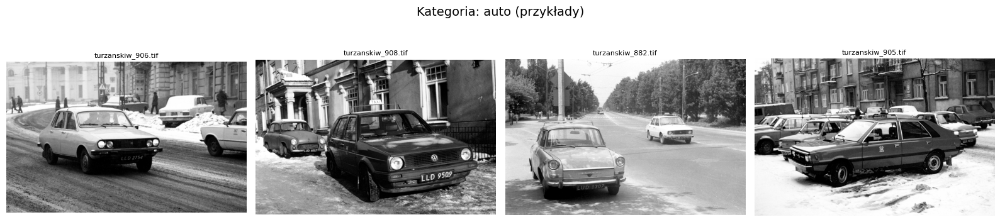

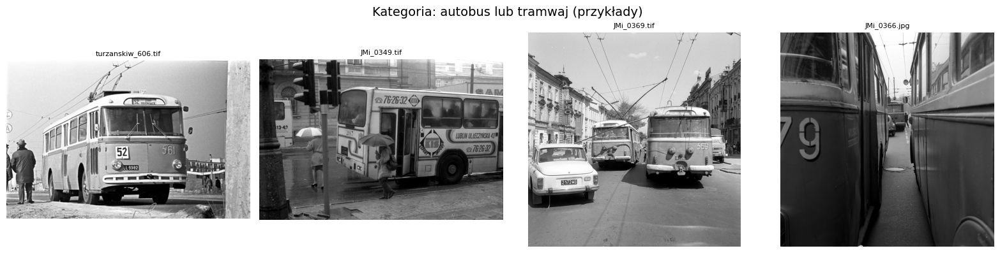

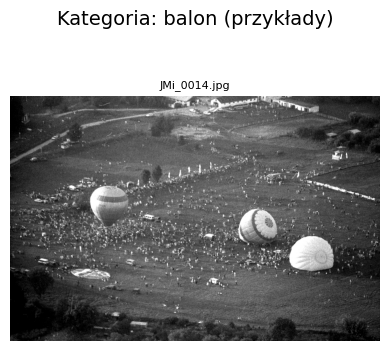

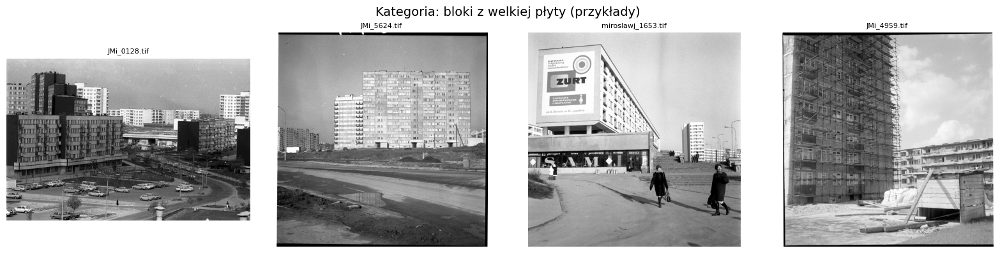

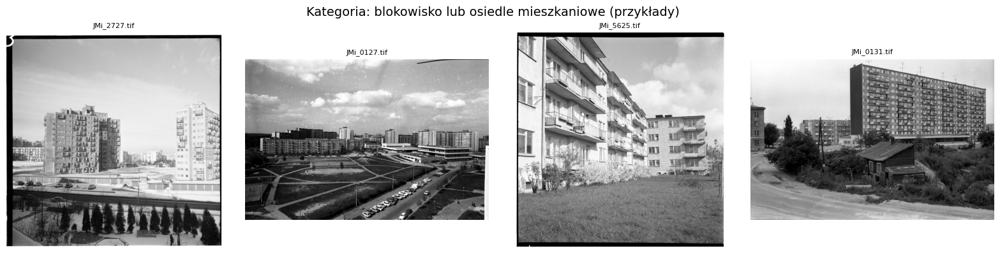

...

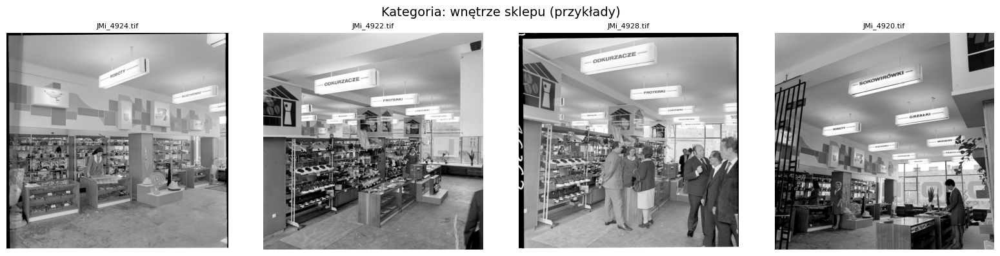

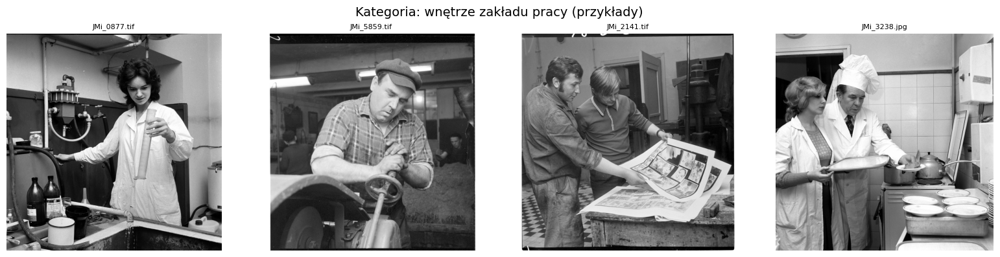

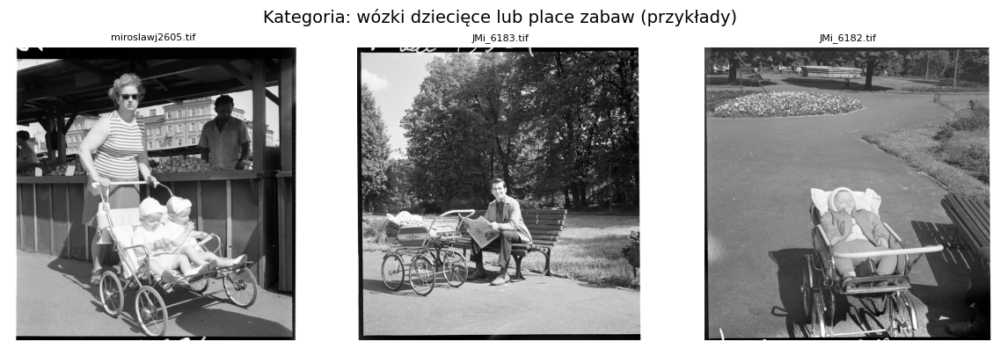

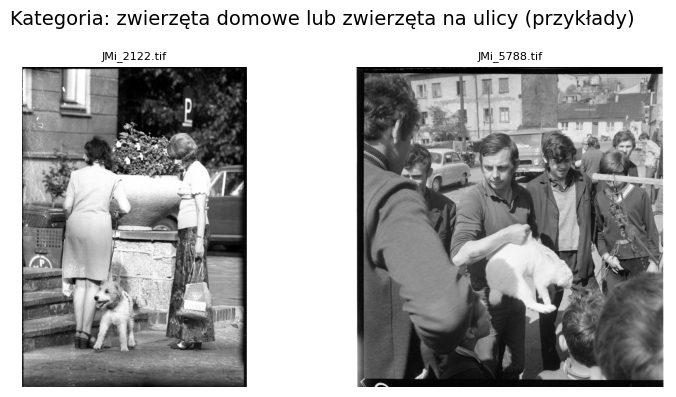

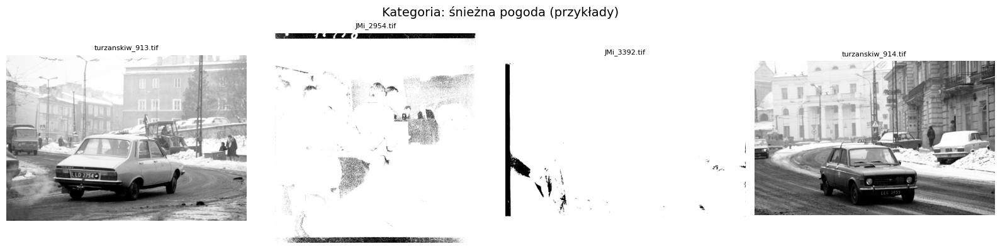

In [ ]:
"""
Podgląd miniatur pogrupowanych wg kategorii sceny.
Z autokontrasten tylko do wizualizacji.
"""

import matplotlib.pyplot as plt
import numpy as np

N_PER_LABEL = 4
all_labels = sorted(df["scene_label"].unique())

for label in all_labels:
    subset = df[df["scene_label"] == label]
    if subset.empty:
        continue

    sample = subset.sample(min(N_PER_LABEL, len(subset)), random_state=42)

    plt.figure(figsize=(4 * len(sample), 4))
    plt.suptitle(f"Kategoria: {label} (przykłady)", fontsize=14)

    for i, row in enumerate(sample.itertuples(), start=1):
        # wczytanie w skali szarości
        img = Image.open(IMG_DIR / row.filename).convert("L")
        arr = np.array(img).astype("float32")

        # rozciągnięcie kontrastu wg percentyli 1–99
        p1, p99 = np.percentile(arr, [1, 99])
        arr_norm = np.clip((arr - p1) / (p99 - p1 + 1e-8), 0, 1)

        plt.subplot(1, len(sample), i)
        plt.imshow(arr_norm, cmap="gray")
        plt.title(row.filename, fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

min, max: 0 255


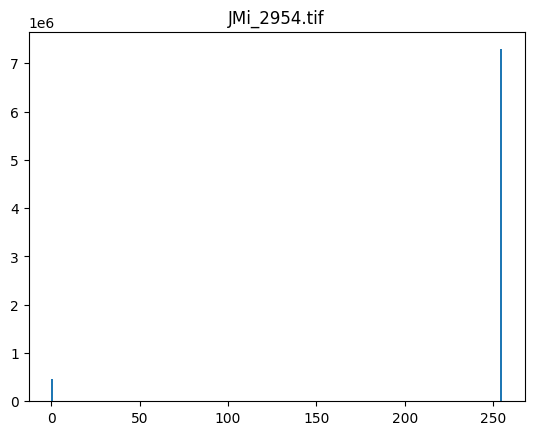

In [26]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

fname = "JMi_2954.tif"  # przykład wybielonego pliku
img = Image.open(IMG_DIR / fname).convert("L")  # skala szarości
arr = np.array(img)

print("min, max:", arr.min(), arr.max())

plt.hist(arr.flatten(), bins=256)
plt.title(fname)
plt.show()